# Traffic congestion:

Traffic congestion constitutes a major challenge that must be addressed in urban environments to improve the quality of life for inhabitants.
Traffic congestion is measured based on several parameters such as delay, speed, length of road segments, number of vehicles, etc. Road space occupancy is also considered a measure to determine traffic congestion in a particular area.The road occupancy rate is determined by considering factors such as the number of vehicles, the length of the road segment, the length of the vehicles, and the average space between vehicles on the road. In this study, we aim to predict the road occupancy rate based on the types of vehicles that influence traffic congestion, along with the time of day, by taking into account the key contributing features.

## Data Preprocessing 

Resolving the invalid json packets from the data and removing unimportant attributes, duplicates and other corrections for further analysis.

In [1]:
#Prerequisite python packages 
import pandas as pd
import ast
import json
import warnings
warnings.filterwarnings('ignore')

In [18]:
filename = "traffic_density_test.json"

with open(filename, 'r') as file:
    json_data = file.read()

corrected_json_data = json_data.replace('}{', '},{')

if not (corrected_json_data.startswith('[') and corrected_json_data.endswith(']')):
    corrected_json_data = '[' + corrected_json_data + ']'

json_list = json.loads(corrected_json_data)

df = pd.DataFrame(json_list)

df.to_csv("traffic_density_test.csv")

'filename = "/home/iudx/pari/python/model/pryagraj_traffic_density/traffic_density_test.json"\n\nwith open(filename, \'r\') as file:\n    json_data = file.read()\n\ncorrected_json_data = json_data.replace(\'}{\', \'},{\')\n\nif not (corrected_json_data.startswith(\'[\') and corrected_json_data.endswith(\']\')):\n    corrected_json_data = \'[\' + corrected_json_data + \']\'\n\njson_list = json.loads(corrected_json_data)\n\ndf = pd.DataFrame(json_list)\n\n#df.to_csv("/home/iudx/pari/python/model/pryagraj_traffic_density/traffic_density_test.csv")'

Load Dataset 

In [2]:
filename = "/home/iudx/pari/python/model/pryagraj_traffic_density/traffic_density_train.csv"
df = pd.read_csv(filename)

In [9]:
df.head()

,Unnamed: 0.1,Unnamed: 0,vehicleTypeCount,roadID,id,vehicleCount,roadOccupancy,junctionID,observationDateTime,zoneID,junctionMode,count_car,count_pedestrian,count_cycle,count_truck,count_threewheeler,count_motorbike
0,0,0,"{'car': 0, 'pedestrian': 0, 'cycle': 0, 'truck...",L01,a4e1d614-ee93-4e37-9e40-629a3b9e4299,2.0,0.0067,J035,2024-05-10T00:25:00+05:30,1,FLSH,0,0,0,0,0,0
1,1,1,"{'car': 0, 'pedestrian': 0, 'cycle': 0, 'truck...",L02,a4e1d614-ee93-4e37-9e40-629a3b9e4299,5.0,0.0167,J035,2024-05-10T00:25:00+05:30,1,FLSH,0,0,0,0,0,0
2,2,2,"{'car': 0, 'pedestrian': 0, 'cycle': 0, 'truck...",L02,a4e1d614-ee93-4e37-9e40-629a3b9e4299,0.0,0.0000,J035,2024-05-10T00:25:00+05:30,2,FLSH,0,0,0,0,0,0
3,3,3,"{'car': 0, 'pedestrian': 0, 'cycle': 0, 'truck...",L03,a4e1d614-ee93-4e37-9e40-629a3b9e4299,22.0,0.0733,J035,2024-05-10T00:25:00+05:30,1,FLSH,0,0,0,0,0,0
4,4,4,"{'car': 0, 'pedestrian': 0, 'cycle': 0, 'truck...",L03,a4e1d614-ee93-4e37-9e40-629a3b9e4299,43.0,0.1433,J035,2024-05-10T00:25:00+05:30,2,FLSH,0,0,0,0,0,0


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 932750 entries, 0 to 932749
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Unnamed: 0.1         932750 non-null  int64  
 1   Unnamed: 0           932750 non-null  int64  
 2   vehicleTypeCount     932750 non-null  object 
 3   roadID               932750 non-null  object 
 4   id                   932750 non-null  object 
 5   vehicleCount         932750 non-null  float64
 6   roadOccupancy        932750 non-null  float64
 7   junctionID           932750 non-null  object 
 8   observationDateTime  932750 non-null  object 
 9   zoneID               932750 non-null  int64  
 10  junctionMode         932750 non-null  object 
 11  count_car            932750 non-null  int64  
 12  count_pedestrian     932750 non-null  int64  
 13  count_cycle          932750 non-null  int64  
 14  count_truck          932750 non-null  int64  
 15  count_threewheele

In [3]:
df.zoneID = df.zoneID.astype(str)

In [25]:
df.describe()

,Unnamed: 0.1,Unnamed: 0,vehicleCount,roadOccupancy,count_car,count_pedestrian,count_cycle,count_truck,count_threewheeler,count_motorbike
count,932750.000000,932750.000000,932750.000000,932750.000000,932750.000000,932750.0,932750.0,932750.000000,932750.0,932750.000000
mean,466374.500000,466374.500000,27.055381,0.090184,8.482146,0.0,0.0,2.153927,0.0,10.198421
std,269261.876132,269261.876132,39.796204,0.132654,16.297627,0.0,0.0,5.358592,0.0,20.973155
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000
25%,233187.250000,233187.250000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000
50%,466374.500000,466374.500000,8.000000,0.026700,0.000000,0.0,0.0,0.000000,0.0,0.000000
75%,699561.750000,699561.750000,40.000000,0.133300,10.000000,0.0,0.0,2.000000,0.0,10.000000
max,932749.000000,932749.000000,454.000000,1.513300,176.000000,0.0,0.0,120.000000,0.0,301.000000


In [7]:
df.shape

(932750, 17)

In [4]:
df.isna().sum()

Unnamed: 0.1           0
Unnamed: 0             0
vehicleTypeCount       0
roadID                 0
id                     0
vehicleCount           0
roadOccupancy          0
junctionID             0
observationDateTime    0
zoneID                 0
junctionMode           0
count_car              0
count_pedestrian       0
count_cycle            0
count_truck            0
count_threewheeler     0
count_motorbike        0
dtype: int64

In [5]:
int_float_columns = df.select_dtypes(include=['int64', 'float64'])

columns_with_only_zero = [col for col in int_float_columns.columns if (df[col] == 0).all()]
columns_with_only_zero

['count_pedestrian', 'count_cycle', 'count_threewheeler']

Filtering out unnecessary features from the dataset. Features such as count_threewheeler, count_pedestrian, and count_cycle have zero values due to unavailability of data from the smart city, so these are removed from the dataset as they do not add any value to the model.

In [6]:
df = df.drop(columns = ['vehicleTypeCount','Unnamed: 0.1','Unnamed: 0','id','count_threewheeler','count_pedestrian','count_cycle'])

To check and removing the duplicates in the training dataset

In [7]:
df.duplicated().sum() 

165

In [8]:
df = df.drop_duplicates()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7efecbd16730>,
      dtype=object)

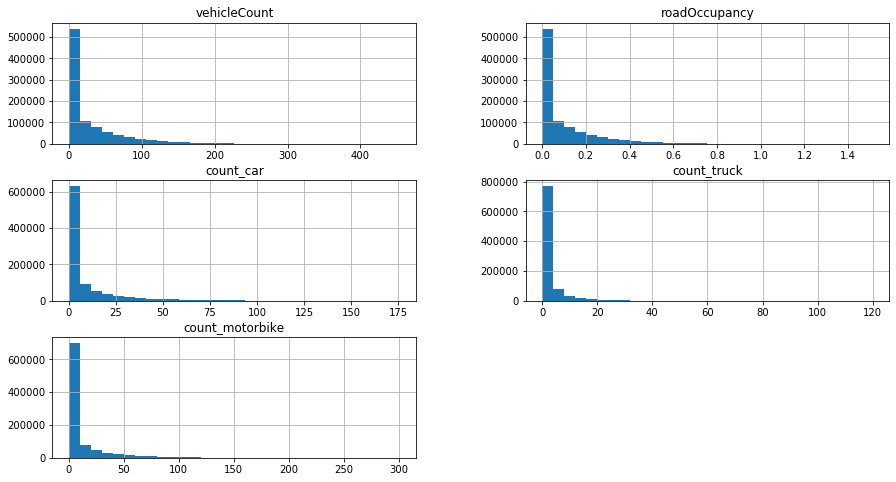

In [9]:
df.hist(bins=30 , figsize=(15,8))

### Converting the observationDateTime from string to datetime
Extracting the hour, day and month from the date time parameter for the analysis and aggregating the data for hourly intervals


In [10]:
df['observationDateTime'] = pd.to_datetime(df['observationDateTime'])

In [11]:
df['hour'] = df['observationDateTime'].dt.hour
df['weekday'] = df['observationDateTime'].dt.dayofweek 
df['month'] = df['observationDateTime'].dt.month

In [12]:
df = df.groupby(['roadID', 'junctionID', 'hour', 'weekday', 'month']).agg({
    'vehicleCount': 'sum',
    'roadOccupancy': 'mean',
    'count_car': 'sum',
    'count_truck': 'sum',
    'count_motorbike': 'sum'
}).reset_index()


In [58]:
df.head()

,roadID,junctionID,zoneID,hour,weekday,month,vehicleCount,roadOccupancy,count_car,count_truck,count_motorbike
0,02,J031,2,0,0,5,27.0,0.006414,0,0,27
1,02,J031,2,0,1,5,25.0,0.005194,0,0,25
2,02,J031,2,0,2,5,29.0,0.006025,0,0,29
3,02,J031,2,0,3,5,15.0,0.006237,1,0,14
4,02,J031,2,0,4,5,24.0,0.004987,2,0,22


### Visualising the distribution of vehicle counts and road occupancy


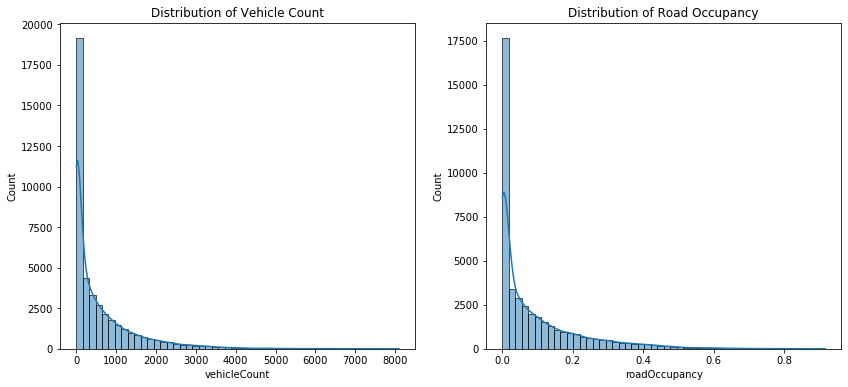

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(df['vehicleCount'], bins=50, kde=True)
plt.title('Distribution of Vehicle Count')

plt.subplot(1, 2, 2)
sns.histplot(df['roadOccupancy'], bins=50, kde=True)
plt.title('Distribution of Road Occupancy')

plt.show()

In [16]:
import plotly.express as px
import plotly.graph_objects as go

fig = px.scatter(df, x='hour', y='count_car', color='roadID',
              title='Car Count by Hour for Each RoadID',
              labels={'count_car': 'Car Count', 'hour': 'Hour of the Day'})

fig.show()

## Analyze traffic patterns over different times of the day


In [21]:

import plotly.express as px

fig_road_occupancy = px.scatter(df, x='hour', y='roadOccupancy', title='Road Occupancy by Hour of the Day')

fig_road_occupancy.show()

In [24]:
import plotly.express as px

fig_vehicle_count = px.bar(df, x='hour', y='count_motorbike', title='Motor cycle count by Hour of the Day')

fig_road_occupancy = px.bar(df, x='hour', y='count_car', title='Count of cars by Hour of the Day')

fig_vehicle_count.show()
fig_road_occupancy.show()

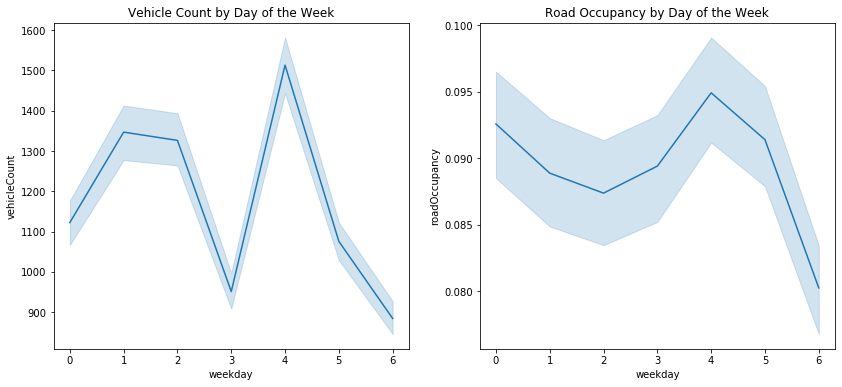

In [28]:
# By day of the week
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.lineplot(x='weekday', y='vehicleCount', data=df)
plt.title('Vehicle Count by Day of the Week')

plt.subplot(1, 2, 2)
sns.lineplot(x='weekday', y='roadOccupancy', data=df)
plt.title('Road Occupancy by Day of the Week')

plt.show()

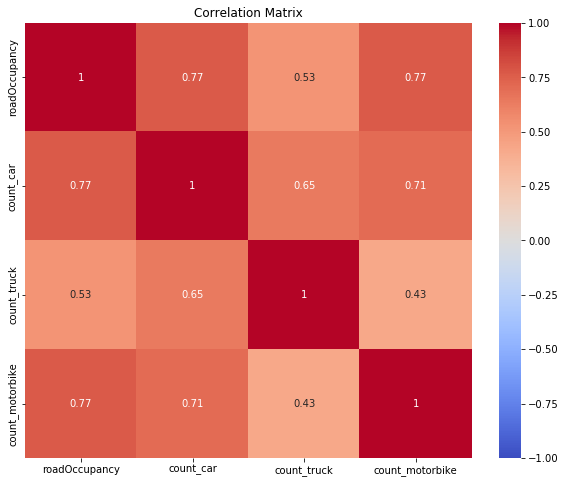

In [33]:
# Explore the correlation between various features
corr_matrix = df[['roadOccupancy', 'count_car', 'count_truck', 'count_motorbike']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()


### Pairplot for Correlation Analysis


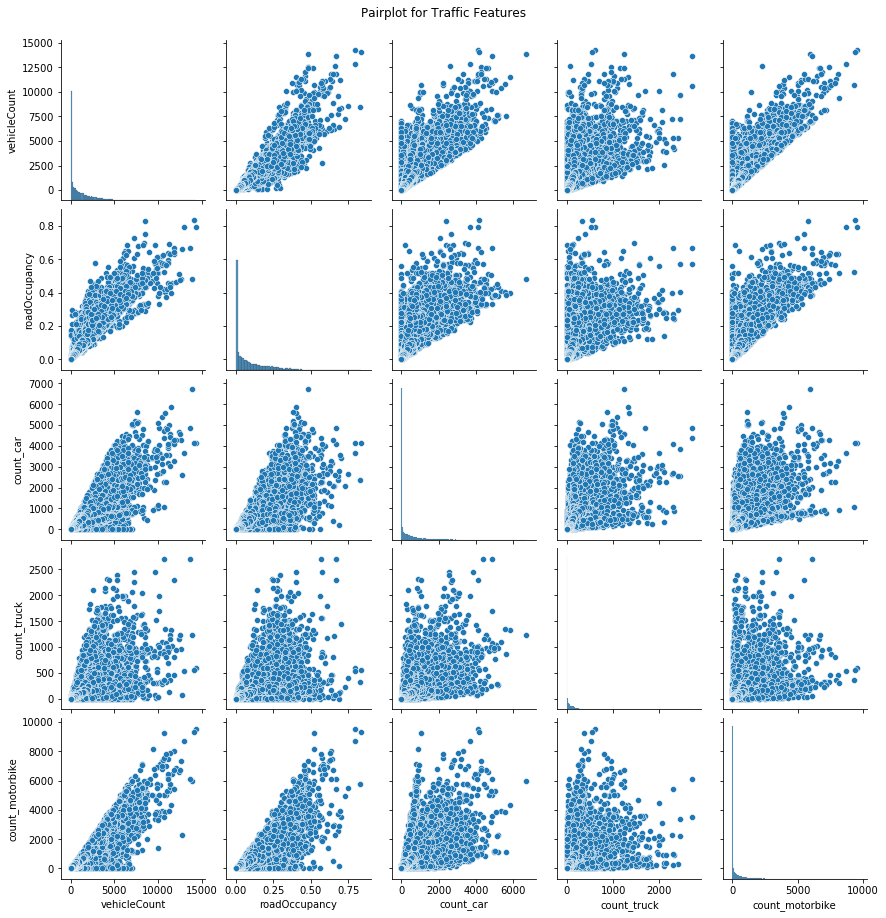

In [53]:
sns.pairplot(df[['vehicleCount', 'roadOccupancy', 'count_car', 'count_truck', 'count_motorbike']])
plt.suptitle('Pairplot for Traffic Features', y=1.02)
plt.show()

Based on the correlation matrix, the features such as count_motorbike, count_car have more correlation with the roadOccupancy rate, compared with other features. Hence these two features are considered for further analysis to predict the traffic density through the roadOccupancy rate.

In [34]:
df.head()

,roadID,junctionID,zoneID,hour,weekday,month,vehicleCount,roadOccupancy,count_car,count_truck,count_motorbike
0,02,J031,2,0,0,5,27.0,0.006414,0,0,27
1,02,J031,2,0,1,5,25.0,0.005194,0,0,25
2,02,J031,2,0,2,5,29.0,0.006025,0,0,29
3,02,J031,2,0,3,5,15.0,0.006237,1,0,14
4,02,J031,2,0,4,5,24.0,0.004987,2,0,22


## Linear Regression Model

The observed patterns and relationships in the features fit the assumptions of a linear regression model, hence I decided to train the model with the dataset.

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score


X = df[['count_car', 'count_motorbike', 'hour']]
y = df['roadOccupancy']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

lr_model = LinearRegression()

lr_model.fit(X_train, y_train)

y_pred_lr = lr_model.predict(X_test)

print("Linear Regression Performance:")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_lr))
print("R^2 Score:", r2_score(y_test, y_pred_lr))

Linear Regression Performance:
Mean Squared Error: 0.004501729991513633
R^2 Score: 0.7094210853211245


### Residuals Plot

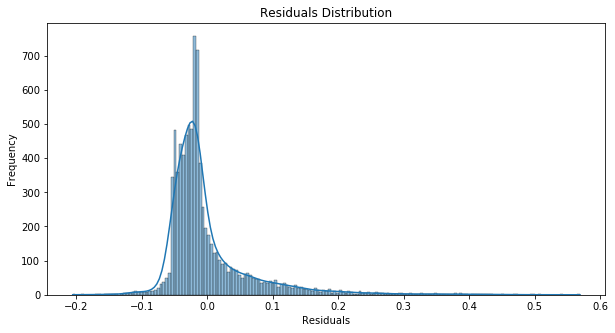

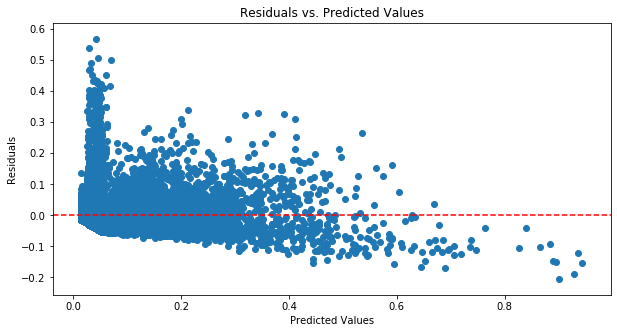

In [57]:
residuals = y_test - y_pred_lr

plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 5))
plt.scatter(y_pred_lr, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()


### Inference:

After analyzing the results of the linear regression, we generated a residual plot which indicated the presence of a non-linear pattern in the data. Given this observation, we have decided to proceed with a non-linear model, specifically the Random Forest model. This approach is expected to capture the complex relationships within the data more effectively, enhancing our predictive capabilities.

## Random Forest Model


In [13]:

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
print("\nRandom Forest Regressor Performance:")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_rf))
print("R^2 Score:", r2_score(y_test, y_pred_rf))


Random Forest Regressor Performance:
Mean Squared Error: 0.00423933575496917
R^2 Score: 0.7263581811968916


## XGBoost Model

In [20]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score


X = df[['count_car', 'count_motorbike', 'hour']]
y = df['roadOccupancy']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

xgb_model = XGBRegressor()
xgb_model.fit(X_train_scaled, y_train)
xgb_preds = xgb_model.predict(X_test_scaled)

xgb_mse = mean_squared_error(y_test, xgb_preds)
print("XGBoost Regressor Mean Squared Error:", xgb_mse)
print("R^2 Score:", r2_score(y_test, xgb_preds))

XGBoost Regressor Mean Squared Error: 0.004163783249139887
R^2 Score: 0.7312349652746858


In [21]:
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0]
}

xgb_reg = XGBRegressor()
random_search = RandomizedSearchCV(estimator=xgb_reg, param_distributions=param_dist, n_iter=70, cv=3, n_jobs=-1, verbose=2, random_state=42)
random_search.fit(X_train_scaled, y_train)

best_reg = random_search.best_estimator_

y_pred = best_reg.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Best Regressor Parameters:", random_search.best_params_)
print("Regressor Mean Squared Error:", mse)
print("Regressor R^2 Score:", r2)

Fitting 3 folds for each of 70 candidates, totalling 210 fits
Best Regressor Parameters: {'subsample': 0.6, 'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.05, 'colsample_bytree': 1.0}
Regressor Mean Squared Error: 0.004122925733703654
Regressor R^2 Score: 0.7338722475004783


In [22]:
from sklearn.model_selection import cross_val_score

cv_scores = cross_val_score(best_reg, X_train_scaled, y_train, cv=5, scoring='r2')
print("Cross-validated R² scores:", cv_scores)
print("Mean cross-validated R² score:", cv_scores.mean())

Cross-validated R² scores: [0.71572731 0.71958221 0.73409995 0.71799371 0.72517336]
Mean cross-validated R² score: 0.7225153083096736


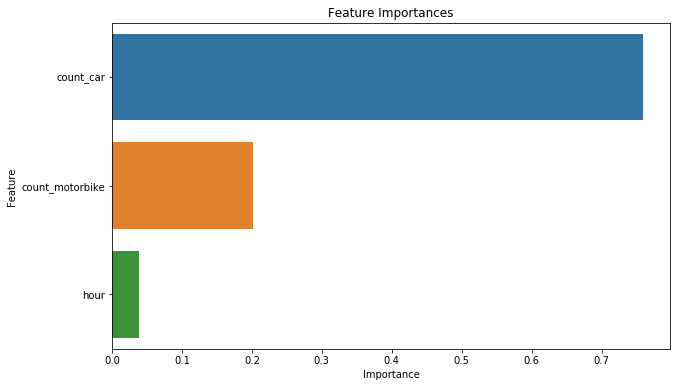

In [23]:
importances = best_reg.feature_importances_
feature_names = X.columns

features_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
features_df = features_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=features_df)
plt.title('Feature Importances')
plt.show()

In [24]:
import joblib

joblib.dump(best_reg, '/home/iudx/pari/python/model/xgb_regressor_model.pkl')
joblib.dump(scaler, '/home/iudx/pari/python/model/scaler.pkl')

['/home/iudx/pari/python/model/scaler.pkl']

### Loading new data for prediction


In [ ]:
test_df = pd.read_csv("/home/iudx/pari/python/model/pryagraj_traffic_density/traffic_density_test.csv")
test_df = test_df.drop(columns = ['vehicleTypeCount','Unnamed: 0.1','Unnamed: 0','id'])

In [25]:
road_ids = test_df['roadID']
junction_ids = test_df['junctionID']

features = test_df[['count_car', 'count_motorbike', 'hour']]

In [26]:
output = pd.DataFrame({
    'roadID': road_ids,
    'junctionID': junction_ids,
    'roadOccupancy': y_pred_loaded
})

In [30]:
test_df['observationDateTime'] = pd.to_datetime(test_df['observationDateTime'])
test_df['hour'] = test_df['observationDateTime'].dt.hour
test_df['day'] = test_df['observationDateTime'].dt.day
test_df['month'] = test_df['observationDateTime'].dt.month
test_df['weekday'] = test_df['observationDateTime'].dt.weekday

In [31]:
test_df = test_df.groupby(['roadID', 'junctionID', 'zoneID', 'hour', 'weekday', 'month']).agg({
    'vehicleCount': 'sum',
    'roadOccupancy': 'mean',
    'count_car': 'sum',
    'count_truck': 'sum',
    'count_motorbike': 'sum'
}).reset_index()


In [46]:
test_df.head()

,roadID,junctionID,zoneID,hour,weekday,month,vehicleCount,roadOccupancy,count_car,count_truck,count_motorbike
0,02,J031,2,0,0,6,10.0,0.004757,2,0,8
1,02,J031,2,0,1,6,7.0,0.005825,0,0,7
2,02,J031,2,1,0,6,4.0,0.004433,0,0,4
3,02,J031,2,1,1,6,3.0,0.005000,0,0,3
4,02,J031,2,2,0,6,7.0,0.003867,0,0,7


In [34]:
xgb_model_loaded = joblib.load('/home/iudx/pari/python/model/xgb_regressor_model.pkl')

road_ids = test_df['roadID']
junction_ids = test_df['junctionID']

features = test_df[['count_car', 'count_motorbike', 'hour']]

predictions = xgb_model_loaded.predict(features)

# Combine the predictions with roadID
output = pd.DataFrame({
    'roadID': road_ids,
    'junctionID': junction_ids,
    'roadOccupancy': predictions
})

#filtered_output = output[output['roadOccupancy'] > 0.6]


In [38]:
output[output.roadOccupancy >0.6]

,roadID,junctionID,roadOccupancy
10,02,J031,0.697942
11,02,J031,0.697942
12,02,J031,0.697942
13,02,J031,0.697942
14,02,J031,0.697942
...,...,...,...
11326,L04,J031,0.697942
11327,L04,J031,0.697942
11328,L04,J031,0.697942
11329,L04,J031,0.697942


### Preparing the available lane information from the Prayagraj city
Loading the LineString data for roads in Prayagraj City to create an interactive map that highlights different levels of traffic density across the city.

In [54]:
filename = "/home/iudx/pari/python/model/pryagraj_traffic_density/lane_info.csv"
df_lane = pd.read_csv(filename)
df_lane.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           96 non-null     int64  
 1   carriagewayLength    96 non-null     float64
 2   observationDateTime  96 non-null     object 
 3   junctionID           96 non-null     object 
 4   roadName             96 non-null     object 
 5   id                   96 non-null     object 
 6   roadID               96 non-null     object 
 7   location             96 non-null     object 
dtypes: float64(1), int64(1), object(6)
memory usage: 6.1+ KB


In [44]:
df_lane.head()

,Unnamed: 0,carriagewayLength,observationDateTime,junctionID,roadName,id,roadID,location
0,0,146.76,2024-05-27T17:43:21+05:30,J001,From Minto Park,b58f2d3b-4bad-4a8b-a5db-7f8b2fc99e25,L02,"{'type': 'LineString', 'coordinates': [[81.860..."
1,1,140.20,2024-05-27T17:43:21+05:30,J001,From Bangad Tiraha,b58f2d3b-4bad-4a8b-a5db-7f8b2fc99e25,L03,"{'coordinates': [[81.86238704543744, 25.439994..."
2,2,134.87,2024-05-27T17:43:21+05:30,J001,From CMP College,b58f2d3b-4bad-4a8b-a5db-7f8b2fc99e25,L04,"{'coordinates': [[81.86082977768876, 25.441168..."
3,3,155.94,2024-05-27T17:43:21+05:30,J002,From Chaufatka Chowki,b58f2d3b-4bad-4a8b-a5db-7f8b2fc99e25,L01,"{'coordinates': [[81.78100876377292, 25.448600..."
4,4,132.98,2024-05-27T17:43:21+05:30,J002,From Dhoomanganj Police Station,b58f2d3b-4bad-4a8b-a5db-7f8b2fc99e25,L02,"{'coordinates': [[81.77969289475932, 25.450382..."


In [43]:
df_lane = df_lane.drop(columns = ['Unnamed: 0','id'])
df_lane.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   carriagewayLength    96 non-null     float64
 1   observationDateTime  96 non-null     object 
 2   junctionID           96 non-null     object 
 3   roadName             96 non-null     object 
 4   roadID               96 non-null     object 
 5   location             96 non-null     object 
dtypes: float64(1), object(5)
memory usage: 4.6+ KB


In [44]:
import ast

def convert_dict_column(dict_str):
    return ast.literal_eval(dict_str.replace("'", '"'))

df_lane['location'] = df_lane['location'].apply(convert_dict_column)

lane_df = df_lane['location'].apply(pd.Series)

loc_df = lane_df.rename(columns=lambda x: x)
df_lane = pd.concat([df_lane, loc_df], axis=1)

## Displaying the lanes based on level of traffic density using Folium

In [52]:
from folium import features
from folium.features import DivIcon, GeoJson
from shapely.geometry import LineString
import folium

df_filtered = pd.merge(output, df_lane, on=['junctionID', 'roadID' ])

def create_geojson_feature(coords, color):
    try:
        line = LineString(coords)
        return features.GeoJson(
            data=line.__geo_interface__,
            style_function=lambda x: {'color': color, 'weight': 5}
        )
    except ValueError as e:
        print(f"Error creating LineString: {e}")
        return None

folium_map = folium.Map(location=[25.4358, 81.8463], zoom_start=13)

def get_color(occupancy):
    
    if 0.3 < occupancy < 0.7:
        return 'cyan'
    elif occupancy > 0.7:
        return 'red'
    elif occupancy < 0.3:
        return 'green'
    

for _, row in df_filtered.iterrows():
    color = get_color(row['roadOccupancy'])
    geojson_feature = create_geojson_feature(row['coordinates'], color)
    if geojson_feature:
        geojson_feature.add_to(folium_map)

folium_map